In [1]:
from skimage import io
from skimage import color
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import HTML
from sklearn.decomposition import PCA
from ipywidgets import interact
import ipywidgets as widgets

Wczytanie obrazka:

Wymiary obrazka: (5525, 3819, 3)


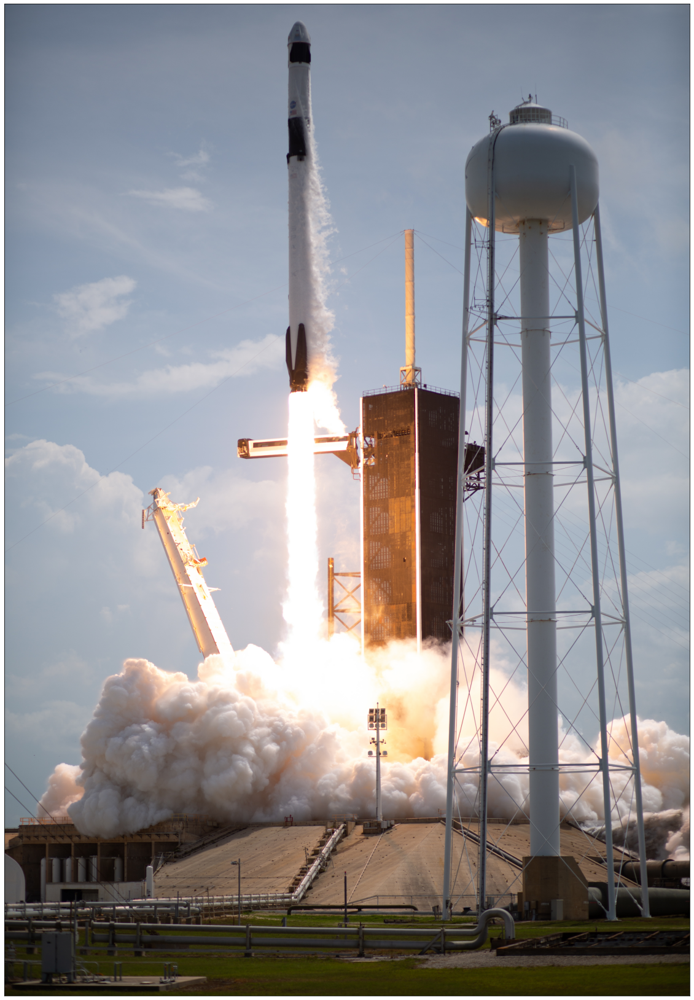

In [103]:
im = io.imread('SpaceX_Demo-2_Launch_(NHQ202005300041).jpg')
print(f'Wymiary obrazka: {im.shape}')

def print_image(im, title = ''):
    fig, axes = plt.subplots(figsize=(20, 40))
    axes.imshow(im)
    axes.set_title(title)
    plt.tick_params(
        axis='both',          
        which='both',
        bottom=False,
        top=False,
        labelbottom=False,
        labelleft=False,
        left=False,
        right=False) 
    plt.show()
print_image(im)

By NASA/Joel Kowsky - <a rel="nofollow" class="external free" href="https://www.flickr.com/photos/nasahqphoto/49953046998/in/photostream/">https://www.flickr.com/photos/nasahqphoto/49953046998/in/photostream/</a>, Domena publiczna, <a href="https://commons.wikimedia.org/w/index.php?curid=90807172">Link</a>

Prezentowane zdjęcie jest wysokiej rozdzielczości 5525x3819 - waży ponad 8 MB. Te wymiary to zdecydowanie zbyt wiele by prezentować je w takim okienku. Ponadto, każdy z kanałów kolorystycznych jest reprezentowany przez inny wymiar - zredukujmy je przy pomocy funkcji `rgb2gray` z pakietu `skimage.color`. Taki zabieg spowoduje utratę kolorystyki.

Nowe wymiary obrazka: (5525, 3819)


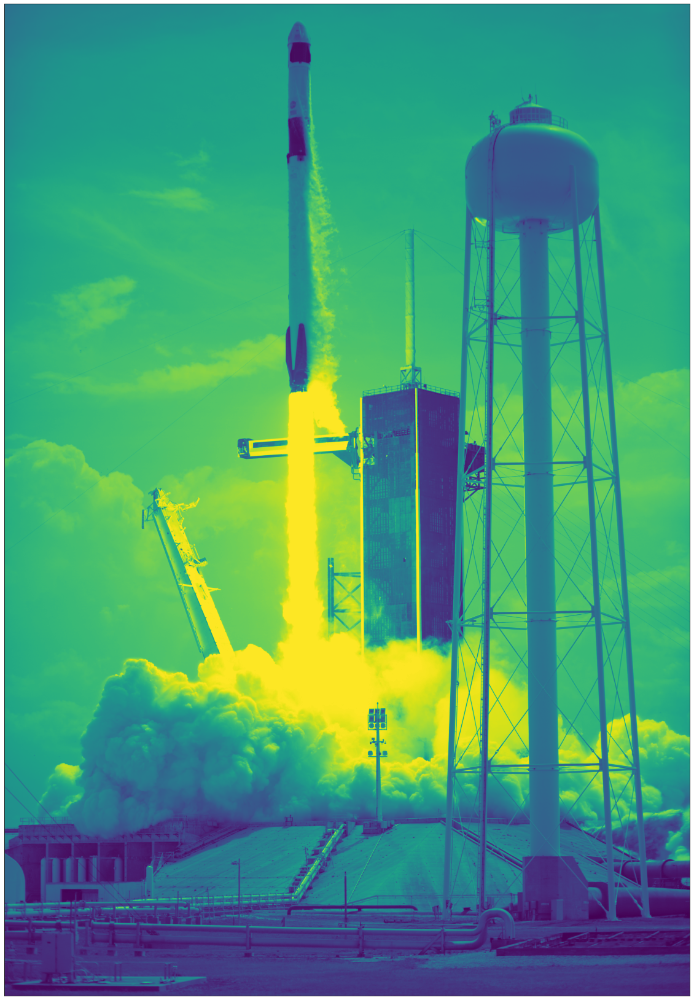

In [104]:
im = color.rgb2gray(im)
print(f'Nowe wymiary obrazka: {im.shape}')
print_image(im)

Pierwsza próba kompresji obrazka: zredukowanie przy pomocy PCA do 1 wymiaru:

In [105]:
pca = PCA(1, random_state = 1)
im2 = pca.fit_transform(im)

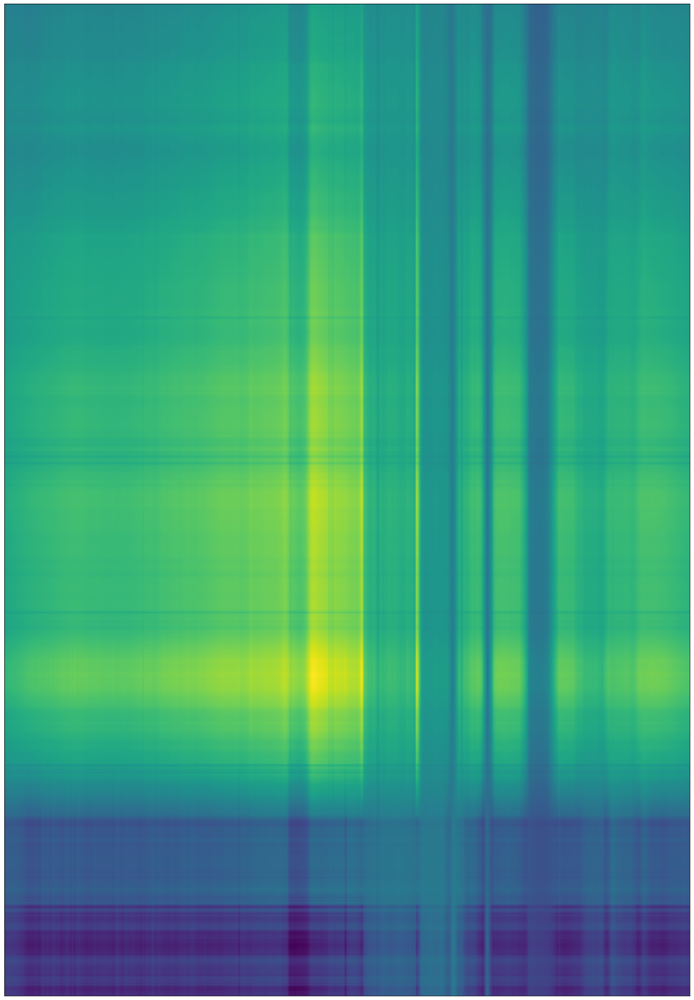

In [106]:
print_image(pca.inverse_transform(im2))

Tak silna próba kompresji zaowocowała tylko kilkoma kolorowymi plamami - nie da się znaleźć rakiety na grafice.

In [107]:
pca.transform(im).shape

(5525, 1)

Sprawdzając kod źródłowy funkcji `inverse_transform` można się dowiedzieć, że gdy parametr `whiten` obiektu `PCA` jest ustawiony jako `False` (domyślnie), dane potrzebne to odtworzenia obrazu znajdują się w atrybutach `mean_`, `components_`. Z tego powodu należy doliczyć ich rozmiary obliczając procent wymiarów jaki udało się zredukować.

In [108]:
def pca_compress(num_components):
    pca = PCA(num_components, random_state = 1)
    im2 = pca.fit_transform(im)
    print(f'Rozmiar danych wejściowych: {im.shape}')
    print(f'Rozmiar danych po kompresji: {im2.shape}')
    print(f'Rozmiary macierzy koniecznych do odtworzenia: {pca.mean_.shape}, {pca.components_.shape}')
    perc = round(100*(1 - (pca.mean_.size + pca.components_.size +im2.size)/im.size), 4)
    print_image(pca.inverse_transform(im2), f'Obraz po {perc}% kompresji')

Rozmiar danych wejściowych: (5525, 3819)
Rozmiar danych po kompresji: (5525, 3)
Rozmiary macierzy koniecznych do odtworzenia: (3819,), (3, 3819)


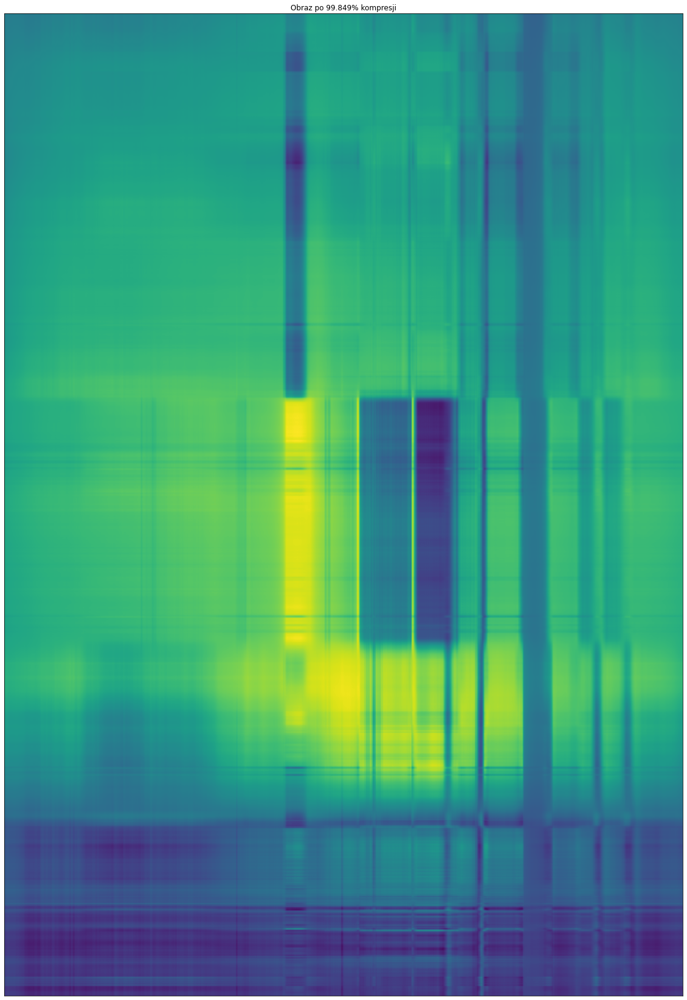

In [109]:
pca_compress(3)

Przez postronnego odbiorcę rakieta może zostać zauważona przy redukcji do ok. 10 wymiarów.

Rozmiar danych wejściowych: (5525, 3819)
Rozmiar danych po kompresji: (5525, 10)
Rozmiary macierzy koniecznych do odtworzenia: (3819,), (10, 3819)


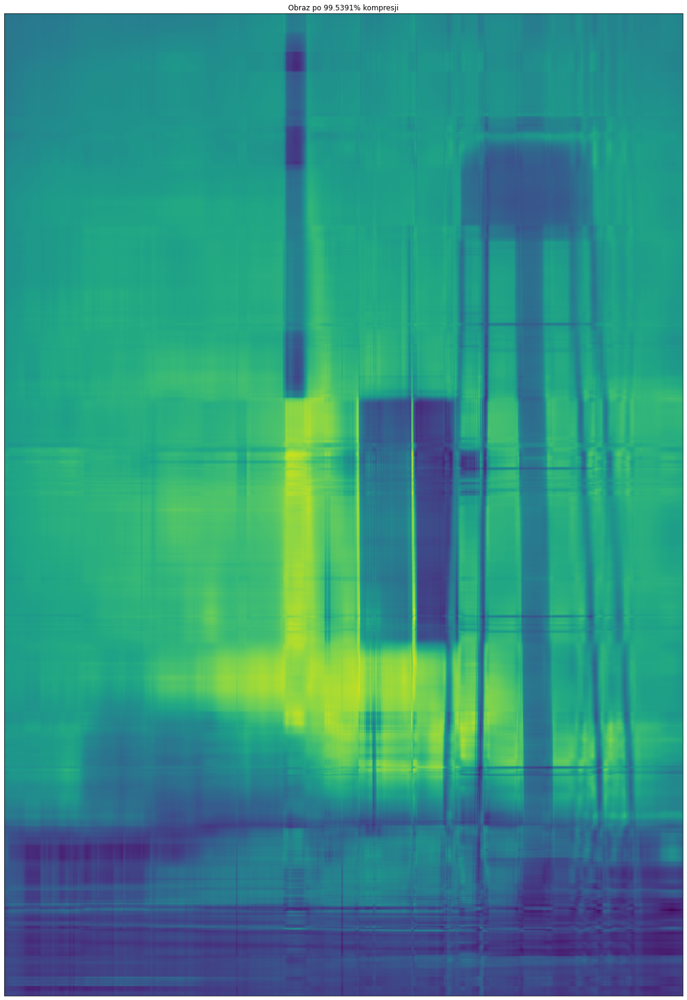

In [114]:
pca_compress(10)

Aby ludzkie oko nie zauważało negatywnych skutków kompresji w tak prezentowanej grafice, liczbę wymiarów należy zredukować do ok. 400 (choć jest to kwestia subiektywna) - pozwala to zmniejszyć rozmiar potrzebnych danych o 82%.

Rozmiar danych wejściowych: (5525, 3819)
Rozmiar danych po kompresji: (5525, 400)
Rozmiary macierzy koniecznych do odtworzenia: (3819,), (400, 3819)


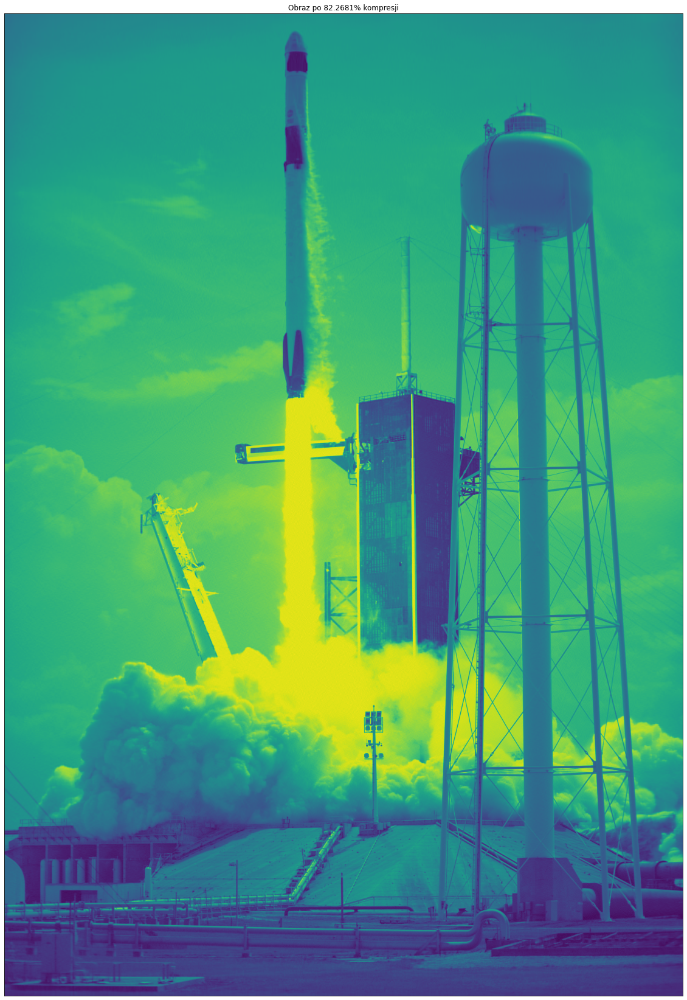

In [119]:
pca_compress(400)

Jak obraz zachowuje się po redukcji do różnych wymiarów? Zapraszam do zabawy!


Uwaga: Do otworzenia poniższej interaktywnej próbki może być konieczność restartu notatnika.

In [120]:
interact(pca_compress,
         num_components=widgets.IntText(
    value=25,
    description='Components:',
    disabled=False
))


interactive(children=(IntText(value=25, description='Components:'), Output()), _dom_classes=('widget-interact'…

<function __main__.pca_compress(num_components)>